In [1]:
!pip install "deeplake<4"
!pip install --upgrade transformers
!pip install nltk
!pip install torchvision

In [2]:
import torch
import torch.nn as nn

import deeplake
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from torchvision import transforms
from transformers import BertTokenizer, BertModel
import nltk
import random

from torch.utils.data import Dataset
from PIL import Image

/Users/irisli0926/Desktop/scifi/.conda/lib/python3.11/site-packages/deeplake/util/check_latest_version.py:32: UserWarning: A newer version of deeplake (4.0.3) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(
/Users/irisli0926/Desktop/scifi/.conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Video to Frames

In [3]:
!pip install --upgrade opencv-python opencv-python-headless

In [4]:
import cv2
import os

def extract_frames_with_opencv(video_path, output_dir, gap):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Cannot open video file {video_path}")
        return []

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    print(f"Video FPS: {fps}, Total frames: {total_frames}")

    frame_count = 0
    saved_count = 0
    image_paths = []

    while True:
        ret, frame = cap.read()
        if not ret:
            print(f"End of video or frame read failed at frame {frame_count}.")
            break

        if frame_count % gap == 0:
            image_path = os.path.join(output_dir, f"frame_{saved_count*gap}.jpg")
            cv2.imwrite(image_path, frame)
            image_paths.append(image_path)
            saved_count += 1
            print(f"Saved frame {frame_count} to {image_path}")

        frame_count += 1

    cap.release()
    print(f"Total frames processed: {frame_count}")
    print(f"Total frames saved: {saved_count}")
    return image_paths

In [5]:
# example run
video_path = "try.mp4"
output_dir = "extracted_images_good"
gap = 10

extracted_images = extract_frames_with_opencv(video_path, output_dir, gap)
print("Extracted image paths:", extracted_images)

Video FPS: 25, Total frames: 216
Saved frame 0 to extracted_images_good/frame_0.jpg
Saved frame 10 to extracted_images_good/frame_10.jpg
Saved frame 20 to extracted_images_good/frame_20.jpg
Saved frame 30 to extracted_images_good/frame_30.jpg
Saved frame 40 to extracted_images_good/frame_40.jpg
Saved frame 50 to extracted_images_good/frame_50.jpg
Saved frame 60 to extracted_images_good/frame_60.jpg
Saved frame 70 to extracted_images_good/frame_70.jpg
Saved frame 80 to extracted_images_good/frame_80.jpg
Saved frame 90 to extracted_images_good/frame_90.jpg
Saved frame 100 to extracted_images_good/frame_100.jpg
Saved frame 110 to extracted_images_good/frame_110.jpg
Saved frame 120 to extracted_images_good/frame_120.jpg
Saved frame 130 to extracted_images_good/frame_130.jpg
Saved frame 140 to extracted_images_good/frame_140.jpg
Saved frame 150 to extracted_images_good/frame_150.jpg
Saved frame 160 to extracted_images_good/frame_160.jpg
Saved frame 170 to extracted_images_good/frame_170.jpg

## Preprocess Data

In [8]:
ds = deeplake.load('hub://activeloop/flickr30k')

|

Opening dataset in read-only mode as you don't have write permissions.


\

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/flickr30k



|

hub://activeloop/flickr30k loaded successfully.



In [9]:
images = ds.image
captions = ds.caption_0 ## NextSteps: currently only training on caption0, could include other set of captions

### Tokenizing

In [10]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

In [11]:
## ALL Hyperparameters
caption_max_length = 20
vocab_size = len(tokenizer)

In [12]:
def process_image(image):
  """
  Image transformation functions
  Resizes images to 224x224, converts to tensor, and normalizes
  The normalization parameters are mean, SD of of r, g, b pixel values
  """
  image_transform = transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  ])
  image = image.numpy()
  image = Image.fromarray(image)
  image = image_transform(image)
  return image


def process_caption(caption_text):
  """
  Tokenizes captions
  Returns tensor of tokenized captions, with a max length of 20,
  padding until this length, and truncating if the caption is longer
  The individual entries in the tensor are integers
  """

  tokenized = tokenizer(caption_text,
                        max_length=caption_max_length,
                        padding='max_length',
                        truncation=True,
                        return_tensors='pt')

  input_ids = tokenized['input_ids']
  attention_mask = tokenized['attention_mask']
  return input_ids

def untokenize(tokenized_text):
    """
    Untokenizes a tensor
    Takes a tensor of integers, and according to tokenizer, returns
    original words
    """
    return tokenizer.decode(tokenized_text, skip_special_tokens=True)


#### Tests

tests for tokenizer

In [13]:
strings = ["hello world", "my dog went to the store", "the earth revolves around the sun",
           "I travelled to new york city and ate mexican and japanese food"]

def test_tokenizer(strings):
    """
    Function to test tokenizer, by tokenizing and untokenizing a string
    """
    for string in strings:
        # print ("input string: " + string)
        check = untokenize(process_caption(string)[0])
        # print ("output string: " + check)
        assert check.lower() == string.lower()
    print("All tests passed!")
test_tokenizer(strings)

All tests passed!


In [14]:
tokenizer.tokenize("Hello I am Wendy")
tokenizer.encode("Hello I am Wendy", add_special_tokens = True)

[101, 7592, 1045, 2572, 12815, 102]

### tests for data processing

In [15]:
def test_process_image():
  test_img = ds.image[0]
  transformed_img = process_image(test_img)
  assert transformed_img.size(1) == 224 and transformed_img.size(2) == 224, "Image resizing failed."
  assert transformed_img.size(0) == 3, "Image channel mismatch."
  print("All tests passed!")

test_process_image()


All tests passed!


In [16]:
def test_process_caption():
  caption = "A dog playing in the park."
  input_ids = process_caption(caption)
  assert input_ids.size(1) == 20, "Tokenized length incorrect."

  decoded_caption = untokenize(input_ids[0])
  assert decoded_caption.lower() == caption.lower(), "Caption untokenization incorrect."
  print("All tests passed!")
test_process_caption()

All tests passed!


### Dataset/Dataloader Creation

In [17]:
class Flickr30kDataset(Dataset):
    def __init__(self, images, captions, image_transform=None, caption_transform = None):
      """
      Initializes dataset
      """
      self.images = images
      self.captions = captions
      self.image_transform = image_transform
      self.caption_transform = caption_transform

    def __len__(self):
      """
      Returns length of the dataset
      """
      return len(self.captions)

    def __getitem__(self, idx):
      """
      Returns a single item (image, and caption processed according to
      caption_transform) from the dataset
      """
      image = self.images[idx]
      image = self.image_transform(image)

      caption = self.captions[idx].numpy()[0]
      caption_embedding = self.caption_transform(caption)
      return image, caption_embedding


In [18]:
from torch.utils.data import DataLoader, random_split

flickr_dataset = Flickr30kDataset(images, captions, image_transform=process_image, caption_transform=process_caption)

# 80% train, 10% val, 10% Test
train_size = int(0.8 * len(flickr_dataset))
val_size = int(0.1 * len(flickr_dataset))
test_size = len(flickr_dataset) - train_size - val_size

train_dataset, eval_dataset, test_dataset = random_split(flickr_dataset, [train_size, val_size, test_size])

batch_size = 32 # TODO
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
eval_dataloader = DataLoader(eval_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [19]:
## SMALLER DATASET FOR SAMPLE
from torch.utils.data import Subset
import random

# TODO:
train_n = 100
eval_n = 2
batch = 1

train_indices = random.sample(range(len(flickr_dataset)), train_n)
train_subset = Subset(flickr_dataset, train_indices)
mini_train_dataloader = DataLoader(train_subset, batch_size=batch, shuffle=False)

eval_indices = random.sample(range(len(flickr_dataset)), eval_n)
eval_subset = Subset(flickr_dataset, eval_indices)
mini_eval_dataloader = DataLoader(eval_subset, batch_size=batch, shuffle=False)

#### Tests

tests for dataset

In [20]:
def test_flickr30k_dataset():
    dataset = Flickr30kDataset(images, captions, image_transform=process_image, caption_transform=process_caption)
    assert len(dataset) == len(captions), "Dataset length mismatch."

    image, caption_embedding = dataset[0]
    assert image.size(0) == 3 and image.size(1) == 224 and image.size(2) == 224, "Image shape incorrect."
    assert caption_embedding.size(1) == 20, "Caption max length incorrect."
    print("All tests passed!")

test_flickr30k_dataset()

All tests passed!


## CNN

In [21]:
class CNN(nn.Module):
  def __init__(self):
    """
    Initializes convolutional neural network
    """
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=4, kernel_size=3, stride=2, padding=1)
    self.conv2 = nn.Conv2d(in_channels=4, out_channels=16, kernel_size=3, stride=2, padding=1)
    self.conv3 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=2, padding=1)

    self.relu = nn.ReLU()
    self.fc = nn.Linear(in_features=288, out_features=1024)
    self.fc2 = nn.Linear(1024, 256)
    self.flatten = nn.Flatten()

    self.maxPool = nn.MaxPool2d((2, 2), stride=2)

    self.batchNorm1 = nn.BatchNorm2d(4)
    self.batchNorm2 = nn.BatchNorm2d(16)
    self.batchNorm3 = nn.BatchNorm2d(32)

  def forward(self, x):
    """
    Forward pass of convolutional neural network
    """
    # for each layer, run convolutional layer, batch normalization layer,
    # then maxPool layer
    layer1 = self.maxPool(self.relu(self.batchNorm1(self.conv1(x))))
    layer2 = self.maxPool(self.relu(self.batchNorm2(self.conv2(layer1))))
    layer3 = self.maxPool(self.relu(self.batchNorm3(self.conv3(layer2))))
    x1 = self.flatten(layer3)
    # print(x1.shape) # 1, 288
    hidden = self.relu(self.fc(x1)) #1, 1024
    x = self.fc2(hidden) # 1, 4
    # print(x.shape )
    return x


#### Tests

Tests for CNN

In [22]:
def test_cnn_forward_pass():
    cnn_model = CNN().to("cpu")
    test_img = torch.randn(1, 3, 224, 224).to("cpu")
    features = cnn_model(test_img)
    assert features.size(1) == 256, "CNN dimension incorrect."

test_cnn_forward_pass()

## RNN

In [23]:
print("vocab size", tokenizer.vocab_size)
print("embed dim", bert_model.config.hidden_size)


vocab size 30522
embed dim 768


In [24]:
class DecoderRNN(nn.Module):
    def __init__(self, vocab_size = 30522, embed_dim = 768, feature_dim = 256, hidden_dim= 512, max_length= 20):
      """
      Initializes RNN
      vocab_size = vocab size of bert tokenizer
      embed_dim = bert_model config hidden size
      feature_dim = from CNN output
      hidden_dim = hidden dimension of RNN
      """

      super(DecoderRNN, self).__init__()
      # embedding layer
      self.embedding = nn.Embedding(vocab_size, embed_dim)
      # long-short term memory nodes
      self.lstm = nn.LSTM(embed_dim + feature_dim, hidden_dim, batch_first=True)
      self.fc = nn.Linear(hidden_dim, vocab_size)
      self.max_length = max_length
      self.hidden_dim = hidden_dim

    def init_hidden(self, batch_size):
      """
      initialize hidden layer of model
      """
      return (torch.zeros(1, batch_size, self.hidden_dim).to(device), # h
              torch.zeros(1, batch_size, self.hidden_dim).to(device)) # c

    def forward(self, features, captions, hidden = None):
      """
      Runs one step of RNN
      """
      # Note: Initial caption is the <START> token
      embeddings = self.embedding(captions)  # (batch_size, max_length, embed_dim)
      features = torch.unsqueeze(features, 1) # (batch, 1, feature )
      inputs = torch.cat((features, embeddings), dim=2)  # (batch_size, max_length, embed_dim + feature_dim)

      lstm_out, hidden = self.lstm(inputs, hidden)  # (batch_size, max_length, hidden_dim)
      outputs = self.fc(lstm_out)  # (batch_size, max_length, vocab_size)
      return outputs, hidden


## TRAIN




In [25]:
def train_model(cnn, rnn, data_loader, ratio = 0.5, device="cpu"):
  cnn.train()
  rnn.train()
  for epoch in range(num_epochs):
    total_loss = 0.0
    for images, captions in data_loader:
      images = images.to(device)
      captions = captions.to(device).long()

      batch_size = len(images) # for each item images set how many are there
      hidden = rnn.init_hidden(batch_size)

      optimizer_cnn.zero_grad()
      optimizer_rnn.zero_grad()

      features = cnn(images)
      captions = captions.squeeze(1)

      # Get the <Start> token
      decoder_input = torch.full((batch_size, 1), tokenizer.cls_token_id).to(device)

      outputs = []

      # Teacher-forcing alg
      if random.random() < ratio:
        use_force = True
      else:
        use_force = True

      # Note RNN predicts one step ahead - cuz of the <start> token
      seq_length = captions.size(1)
      for t in range(1, seq_length):

          output, hidden = rnn(features, decoder_input, hidden)
          outputs.append(output)

          if use_force:
              decoder_input = captions[:, t].unsqueeze(1) # use true caption
          else:
              decoder_input = output.argmax(dim=2)

      outputs = torch.cat(outputs, dim=1)  # (batch , seq length - 1, vocab_size) 2, 19, vocabsize
      outputs = outputs.reshape(-1, outputs.size(2))  # batch * (seqlength - 1), vocab_size

      caption_original = captions[:, 1:]  #( batch , (seqlength - 1) )
      caption_original = caption_original.contiguous().view(-1) #batch * (seqlength - 1)

      print (outputs.shape)
      print (caption_original.shape)

      loss = criterion(outputs, caption_original)

      loss.backward()
      optimizer_cnn.step()
      optimizer_rnn.step()
      total_loss += loss.item()
    avg_loss = total_loss / len(data_loader)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # Save model after each epoch
    # cnn_save_path = f'{home}cnn_epoch_{epoch + 1}.pth'
    # rnn_save_path = f'{home}rnn_epoch_{epoch + 1}.pth'
    # optimizer_cnn_save_path = f'{home}optimizer_cnn_epoch_{epoch + 1}.pth'
    # optimizer_rnn_save_path = f'{home}optimizer_rnn_epoch_{epoch + 1}.pth'

    # torch.save(cnn.state_dict(), cnn_save_path)
    # torch.save(rnn.state_dict(), rnn_save_path)
    # torch.save(optimizer_cnn.state_dict(), optimizer_cnn_save_path)
    # torch.save(optimizer_rnn.state_dict(), optimizer_rnn_save_path)

In [26]:
device = "cuda" if torch.cuda.is_available() else "cpu"
cnn_model = CNN().to(device)
rnn_model = DecoderRNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer_cnn = torch.optim.Adam(cnn_model.parameters(), lr=0.001)
optimizer_rnn = torch.optim.Adam(rnn_model.parameters(), lr=0.001)

num_epochs = 10


In [27]:
train_model(cnn_model, rnn_model, mini_train_dataloader, device=device)

torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 30522])
torch.Size([19])
torch.Size([19, 

## Eval

In [28]:
def eval_model(cnn, rnn, data_loader, device):
  cnn.eval()
  rnn.eval()
  total_loss = 0.0

  with torch.no_grad():
    for images, captions in data_loader:
      images = images.to(device)
      captions = captions.to(device).long()
      captions = captions.squeeze(1)

      # set batch and hidden
      batch_size = len(images)
      hidden = rnn.init_hidden(batch_size)

      features = cnn(images)
      decoder_input = torch.full((batch_size, 1), tokenizer.cls_token_id).to(device) # start
      seq_length = captions.size(1)

      outputs = []

      for t in range(1, seq_length):
          output, hidden = rnn(features, decoder_input, hidden)

          decoder_input = output.argmax(dim=2)
          outputs.append(output)

      outputs = torch.cat(outputs, dim=1) #stack
      outputs = outputs.reshape(-1, outputs.size(2))

      caption_original = captions[:, 1:]
      caption_original = caption_original.contiguous().view(-1) #batch * (seqlength - 1)

      loss = criterion(outputs, caption_original)
      total_loss += loss.item()

  avg_loss = total_loss / len(data_loader)

  print(f"Validation Loss: {avg_loss:.4f}")
  return avg_loss


In [29]:
eval_model(cnn_model, rnn_model, mini_eval_dataloader, device=device)

Validation Loss: 9.4416


9.441583633422852

## Predict

In [30]:
def predict(cnn, rnn, image, device='cpu'):
  cnn.eval()
  rnn.eval()
  image = image.to(device)

  with torch.no_grad():
      features = cnn(image)


  batch_size = 1
  max_length = 20

  start_token = torch.full((batch_size, 1), tokenizer.cls_token_id).to(device)

  hidden = rnn.init_hidden(batch_size)
  predictions = []
  input = start_token

  for _ in range(max_length):
      with torch.no_grad():
          output, hidden = rnn(features, input, hidden)
          # print(output[0])
          predicted_token = output.argmax(dim=2)
          # print(predicted_token)
          predictions.append(predicted_token.item())

          input = predicted_token

          # if predict a </e> end token, Exit
          if predicted_token.item() == tokenizer.sep_token_id:
              break

  predictions = untokenize(predictions)
  return predictions

Sample run

caption: ['Men dressed in red and men dressed in white are playing a game of soccer .']
Predicted Caption: a man in a black trench coat stands with another gray - haired man with


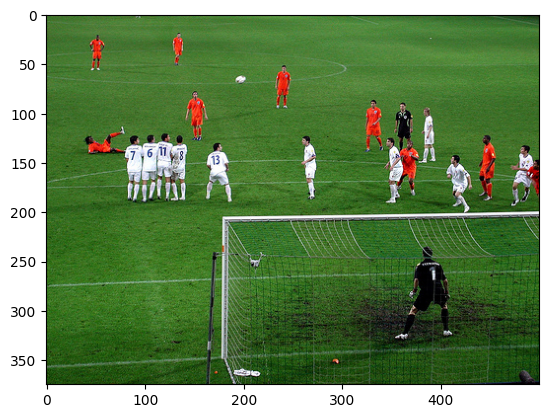

In [31]:
## SAMPLE RUN
index = 9
test_image = ds.image[index]
plt.imshow(test_image.numpy())
print("caption:" , ds.caption_0[index].numpy())

## Process this test_image
processed_test_image = process_image(test_image).unsqueeze(0)
predicted_caption = predict(cnn_model, rnn_model, processed_test_image, device=device)
print("Predicted Caption:", predicted_caption)

# Trying out Transformers
Idea from : https://www.tensorflow.org/text/tutorials/image_captioning

Steps :  

1. Feature Extraction of Image (CNN)

2. Word Embedding : word + positional embedding

3. Decode Layer : Self attention, Cross Attention, Feed Forward Neural Network

4. Output : Post Processing of probability vector

## Feature Extraction

In [32]:
class CNN_feature_extraction(nn.Module):
  def __init__(self):
    """
    Initializes convolutional neural network
    """
    super(CNN_feature_extraction, self).__init__()
    self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1).to(device) # (224,224,64)
    self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1).to(device)# (224,224,128)
    self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1).to(device)# (224,224,256)

    self.relu = nn.ReLU()
    self.fc = nn.Linear(256 * 28 * 28, 512).to(device)
    self.fc2 = nn.Linear(512, 256).to(device)
    self.flatten = nn.Flatten()

    self.maxPool = nn.MaxPool2d(2, 2).to(device)

    self.batchNorm1 = nn.BatchNorm2d(64).to(device)
    self.batchNorm2 = nn.BatchNorm2d(128).to(device)
    self.batchNorm3 = nn.BatchNorm2d(256).to(device)

  def forward(self, x):
    """
    Forward pass of convolutional neural network
    Note: Output is already flattened
    """
    # for each layer, run convolutional layer, batch normalization layer,
    # then maxPool layer
    layer1 = self.maxPool(self.relu(self.batchNorm1(self.conv1(x)))) # batch_size, 64, 112, 112 (b, c , h, w )
    layer2 = self.maxPool(self.relu(self.batchNorm2(self.conv2(layer1)))) # batch_size, 128, 56, 56
    layer3 = self.maxPool(self.relu(self.batchNorm3(self.conv3(layer2)))) # batch_size, 256, 28, 28
    x1 = self.flatten(layer3)  # 1, 200704 = 256*28*28
    hidden = self.relu(self.fc(x1))
    x = self.fc2(hidden) # 1, 256
    return x

#### Tests for feature extractions

In [33]:
def test_feature_extraction():
    data_iter = iter(mini_eval_dataloader)
    batch = next(data_iter)
    images, labels = batch

    image = images[0]
    label = labels[0]  # Corresponding label (if available)

    device = "cuda" if torch.cuda.is_available() else "cpu"

    feature_extractor = CNN_feature_extraction()
    image = image.to(device).unsqueeze(0)
    features = feature_extractor(image)
    assert features.size(0) == 1, "CNN dimension batch size incorrect."
    assert features.size(1) == 256, "CNN dimension incorrect."
    print("Test Passed!")

test_feature_extraction()

Test Passed!


## Embedding Layer
Embedding = Word + Positional Embedding.

In [34]:
## Hyperparameter
embed_dim = 256

In [35]:
class Embedding(nn.Module):
    def __init__(self, vocab_size, max_length, dim):
        """
        Combines token and positional embeddings to produce sequence embeddings for Transformers.
        Input:
          vocab_size: size of vocab. Used for token embedding
          max_length: max length of caption. Used for positional embedding
          dim: Dimension of embedding vectors. Dimension of both token and positional Embedding
        """

        super().__init__()
        self.pos_embedding = nn.Embedding(num_embeddings=max_length, embedding_dim=dim).to(device)
        self.token_embedding = nn.Embedding(num_embeddings=vocab_size, embedding_dim=dim, padding_idx=0).to(device) # ie padding_idx that = 0 will not be trained

    def forward(self, caption):
        """
          Input: Caption (batch, max_length = 20)
          Output: Embedding (batch, max_length, dim)
        """
        _, max_length = caption.shape

        token_embed = self.token_embedding(caption)

        # Create a positional array with length = caption length (20)
        positional_indices = torch.arange(max_length, device=caption.device).unsqueeze(0).to(device) # 1, 20
        position_embed = self.pos_embedding(positional_indices)

        return token_embed + position_embed

#### Test for embedding layer

In [36]:
def test_embedding_layer():
    data_iter = iter(mini_eval_dataloader)
    batch = next(data_iter)
    images, labels = batch

    image = images[0]
    label = labels[0]  # Corresponding label (if available)

    device = "cuda" if torch.cuda.is_available() else "cpu"
    embedding = Embedding(vocab_size, caption_max_length, embed_dim).to(device)
    label = label.to(device)


    if len(label.shape) == 1:
        label = label.unsqueeze(0)  # Adds batch dimension
    elif len(label.shape) == 0:
        label = label.unsqueeze(0).unsqueeze(0)

    seq_embed = embedding(label)
    assert seq_embed.shape == (1,caption_max_length,embed_dim), "CNN dimension incorrect."
    print("Test Passed!")

test_embedding_layer()

Test Passed!


## Decoder
Contains self attention, cross attention, feed forward neural network

In [37]:
## Hyperparameter
num_heads = 1
dropout =  0.1

### Self Attention Layer

In [38]:
class SelfAttention(nn.Module):
    """
    Self-Attention mechanism for token embeddings. Capture dependencies between words.

    Inputs:
        embed_dim: Embedding dimension = embed_dim
        num_heads: The number of attention heads. Each head learns different aspects of the relationships between tokens.
        dropout: Dropout rate used to prevent overfitting
    """
    def __init__(self,  num_heads = 1, embed_dim = embed_dim, dropout=0.1):
        super(SelfAttention, self).__init__()

        print ("embed dim is ", embed_dim)

        self.attention = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout).to(device)
        self.layernorm = nn.LayerNorm(embed_dim).to(device)

    def forward(self, x_token):
        """
        input shape : (batch, max_length, dim)
        output shape : (batch, max_length, dim)
        """
        attn_output, attn_output_weights = self.attention(query=x_token, key=x_token, value=x_token)
        x = x_token + attn_output  #Residual connection prevent vanishing grad
        return self.layernorm(x)

### Cross Attention Layer

In [39]:
class CrossAttention(nn.Module):
    """
    Cross Attention between caption and image.

    Input:
        Caption Embedding : (batch, seq_length, embed_dim)
        Image Feature Extraction : (batch, 256)
    """

    def __init__(self, embed_dim, num_heads=1, dropout=0.1):
        super(CrossAttention, self).__init__()
        self.mha = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout).to(device)
        self.layernorm = nn.LayerNorm(embed_dim).to(device)

    def forward(self, caption, image):
        batch_size_c, seq_length, embed_dim = caption.shape
        batch_size_i, image_embed = image.shape
        assert batch_size_c == batch_size_i, "Batch Dimension of image and caption does not match"
        assert image_embed == 256, "Image Shape Incorrect"
        assert image_embed == embed_dim , "Image dimension does not match Token dimension"

        # create the same image for seq_length
        image_broadcasted = image.unsqueeze(1).repeat(1, seq_length, 1) # batch, seq_length, image_dim
        attn_output, attention_scores = self.mha(query=caption, key=image_broadcasted, value=image_broadcasted)
        caption = caption + attn_output  # Residual connection
        self.last_attention_scores = attention_scores
        return self.layernorm(caption)  #(batch, max_length, image_dim)

#### Tests for Cross Attention

### Feed Forward Neural Network

In [40]:
class FeedForward(nn.Module):
    def __init__(self, embed_dim, dropout_rate=0.1):
        super(FeedForward, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(embed_dim, 2 * embed_dim).to(device),
            nn.ReLU(),
            nn.Linear(2 * embed_dim, embed_dim).to(device),
            nn.Dropout(dropout_rate)
        )
        self.layernorm = nn.LayerNorm(embed_dim).to(device)

    def forward(self, x):
        x = x + self.layer(x).to(device)
        return self.layernorm(x)


### Decoder Layer

In [41]:
class DecoderLayer(nn.Module):
    def __init__(self, embed_dim, num_heads=1, dropout=0.1):
        super(DecoderLayer, self).__init__()

        self.self_attention = SelfAttention(num_heads, embed_dim, dropout)
        self.cross_attention = CrossAttention(embed_dim, num_heads, dropout)
        self.ffnn = FeedForward(embed_dim, dropout)

    def forward(self, inputs):
        image, caption = inputs
        caption_1 = self.self_attention(caption)
        output_seq = self.cross_attention(caption_1, image)
        out_seq = self.ffnn(output_seq)

        self.last_attention_scores = self.cross_attention.last_attention_scores

        return out_seq # batch, seq_length, embed_dim

## Combine + Data PostProcessing

1. Problem: Some tokens occur much more frequently than others in the dataset.
Without adjustment, the model may develop a bias toward predicting these frequent tokens, regardless of context.
Incorporate token frequency information in the logits using the bias term.
For instance, less frequent tokens are given a higher weight, encouraging the model to predict them when appropriate.

2. Problem: Some tokens, like [UNK] or [START], are placeholders or special tokens not intended for prediction.
Solution:
Add a large negative bias (-1e9) to these tokens' logits to make their probabilities effectively zero after softmax.
This guarantees they are not predicted during decoding.

In [42]:
import collections
from tqdm import tqdm

In [43]:
class PostProcessing(nn.Module):
    def __init__(self, embed_dim, tokenizer, banned_tokens=('[UNK]', '[PAD]', '[SEP]', '[CLS]', '[MASK]', 'the', 'a', 'in')):

        super(PostProcessing, self).__init__()
        self.vocab_size = tokenizer.vocab_size
        self.tokenizer = tokenizer
        self.fc = nn.Linear(embed_dim, out_features=tokenizer.vocab_size).to(device) ## Goal is to map to vocab size # batch, seq_length, vocab_size
        self.banned_tokens = banned_tokens

        self.bias = None

    def adapt(self, dataset):
        """
            vocab_dict: a dictionary to map vocab word to assigned index (from 0 to vocab_size)
            counts : a dictionary holding frequency of each word(token), key: id value :freq
        """
        counts = collections.Counter()
        vocab_dict = {name: id for id, name in enumerate(self.tokenizer.vocab)} # map name to id


        for tokens in tqdm(dataset):
            counts.update(tokens.numpy().flatten())  # Update freq for token in the sentence

        # Turn Frequency into an array of all vocabulary
        # fill vocab array with freq
        # array indices = token_id
        counts_arr = np.zeros(shape=(self.vocab_size,))
        indices = np.array(list(counts.keys()), dtype=np.int32)
        counts_arr[indices] = list(counts.values())


        for token in self.banned_tokens:
            id = vocab_dict[token]
            counts_arr[id] = 0

        total = counts_arr.sum()
        p = counts_arr / total
        p[counts_arr == 0] = 1.0  # Prevent log(0)
        log_p = np.log(p)  # log(1) == 0

        entropy = -(log_p * p).sum()

        # print(f"\nUniform entropy: {np.log(self.tokenizer.vocab_size):0.2f}")
        # print(f"Marginal entropy: {entropy:0.2f}")

        self.bias = torch.tensor(log_p, dtype=torch.float32)
        self.bias[counts_arr == 0] = -1e6  # Set large negative values for banned tokens

    def forward(self, input):
        input = input.float()
        x = self.fc(input)
        x = x + self.bias.to(x.device)  # Ensure bias is on the same device as the input
        return x

## Image Captioner : Put all together

In [44]:

class ImageCaption(nn.Module):
    def __init__(self, tokenizer, vocab_size, num_layers=1, embed_dim=256, max_length=20, num_heads=2, dropout=0.1):
        super(ImageCaption, self).__init__()

        self.feature_extractor_model = CNN_feature_extraction()
        self.embedding = Embedding(vocab_size , max_length, embed_dim)
        self.decoder_layer = DecoderLayer(embed_dim)
        self.post_processing_model = PostProcessing(256, tokenizer)

        self.tokenizer = tokenizer

        # self.decoder_layers = nn.ModuleList([
        #     DecoderLayer(embed_dim)
        #     for _ in range(num_layers)
        # ])


    def forward(self, inputs):
        image, caption = inputs

        # Step 1: Extract Features
        extracted_image = self.feature_extractor_model(image)

        # Step 2: Embed the tokens
        tokens = self.embedding(caption)

        # Step 3: Decode
        token_output = self.decoder_layer((extracted_image, tokens))

        output = self.post_processing(token_output)

        return output

In [45]:
image_caption_model = ImageCaption(tokenizer, vocab_size)

embed dim is  256


## Train

In [46]:
def train_model(cnn_feature_extraction, embedder, decoder, post_processor, data_loader, ratio = 0.5, device="cpu"):
  print (device)
  cnn_feature_extraction.train()
  embedder.train()
  decoder.train()
  post_processor.train()

  # original_dataset = data_loader.dataset.dataset

  # indices = data_loader.dataset.indices
  # subset_data = [original_dataset.captions[i] for i in indices]
  # print (subset_data)

  for epoch in range(num_epochs):

    total_loss = 0.0

    count = 0
    for image, c in data_loader:
      captions_list = c[0][0].tolist()  # Convert tensor to list
      decoded_captions = [tokenizer.decode(cap) for cap in captions_list]
      # print (decoded_captions)

      if count == 0:
        all_captions = torch.empty(0, dtype=c.dtype, device=c.device)
      count += 1
      all_captions = torch.cat((all_captions, c.flatten()))

    post_processor.adapt(all_captions)

    for images, captions in data_loader:

      # index = data_loader.dataset.indices[count]

      # test_image = ds.image[index]
      # plt.imshow(test_image.numpy())

      # display(plt.gcf())

      count += 1

      images = images.to(device)

      # images = images.cpu()
      captions = captions.to(device).long()
      # captions = captions.cpu()

      batch_size = len(images) # for each item images set how many are there

      optimizer_cnn.zero_grad()
      optimizer_embedder.zero_grad()
      optimizer_decoder.zero_grad()
      optimizer_post_processor.zero_grad()

      features = cnn_feature_extraction(images)  # shape: 1 x 256
      captions = captions.squeeze(1)

      # list to store full outputs
      outputs = []    # shape: length (grows) * 1 * vocab_size

      # store specific word tokens that have been chosen
      token = torch.full((batch_size, 1), tokenizer.cls_token_id).to(device)  # shape: batch * 1

      seq_length = captions.size(1)

      repeated_words = set()

      for t in range(1, seq_length):

        # run embedder on current tokens
        post_embed = embedder(token)  # shape: batch * token_length (t) * embed_dim

        # run decoder layer
        output = decoder((features, post_embed))  # shape: batch * token_length * embed_dim

        # select the last word
        output_new = output[:, -1, :]    # shape: batch * 1 * embed_dim

        # run through post processing to get vocab size dimension
        after_post_process = post_processor(output_new)    # shape: batch * vocab_size

        for word in repeated_words:
          after_post_process[:, word] -= 1000

        outputs.append(after_post_process)

        # teacher forcing
        ratio = 0.5 - 0.05 * epoch
        if random.random() < ratio:
          next_word = captions[:, t]

        else:
          next_word = torch.argmax(after_post_process, dim=1)   # gets most likely word

        repeated_words.add(next_word)

        token = torch.cat((token, next_word.unsqueeze(0)), dim=1)   # shape: batch * token_length

        if next_word[0] == tokenizer.sep_token_id:   # if ending word: break
          break

      outputs = torch.stack(outputs, dim=1)  # shape: batch * (seq_length - 1) * vocab_size
      outputs = outputs.reshape(-1, outputs.size(2))   # shape: (seq_length - 1) * vocab_size (or shorter in first dim if early termination)


      caption_original = captions[:, 1:]
      caption_original = caption_original.contiguous().view(-1) # shape: (seq-length - 1)

      # computes loss
      length = outputs.shape[0]
      if length < caption_original.shape[0]:
        caption_original = caption_original[:length]

      loss = criterion(outputs, caption_original)

      loss.backward()
      optimizer_cnn.step()
      optimizer_embedder.step()
      optimizer_decoder.step()
      optimizer_post_processor.step()
      total_loss += loss.item()

    avg_loss = total_loss / len(data_loader)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

# remaining things to figure out:
# 1. Make sure the loop is actually right (bug-free != correct)
# 2. The bias thing in post-processing wasn't working; I just commented it out but we'll try again
# 3. If the ending token is generated before 20, I just cut the original caption
# short for computing loss. Is this the best way?
# 4. How does this actually perfrom? Training loss seems high, want to see eval and predict...
# 5. Running on CPU, want to get GPU working

In [47]:
torch.autograd.set_detect_anomaly(True)

cnn_feature_extraction = image_caption_model.feature_extractor_model
embedder = image_caption_model.embedding
decoder = image_caption_model.decoder_layer
post_processor = image_caption_model.post_processing_model
# post_processor.adapt(mini_train_dataloader) (I think we need to do this, but currently
# there are issues, so for now I'm commenting out this (and bias term), will work on fixing later)

device = "cuda" if torch.cuda.is_available() else "cpu"
# device = "cpu"
criterion = nn.CrossEntropyLoss()
optimizer_cnn = torch.optim.Adam(cnn_feature_extraction.parameters(), lr=0.001)
optimizer_embedder = torch.optim.Adam(embedder.parameters(), lr=0.001)
optimizer_decoder = torch.optim.Adam(decoder.parameters(), lr=0.001)
optimizer_post_processor = torch.optim.Adam(post_processor.parameters(), lr=0.001)

num_epochs = 10

print (mini_train_dataloader)
train_model(cnn_feature_extraction, embedder, decoder, post_processor, mini_train_dataloader, device=device)

cpu


100%|██████████| 2000/2000 [00:00<00:00, 421136.00it/s]


Epoch [1/10], Loss: 259115.5553


100%|██████████| 2000/2000 [00:00<00:00, 431579.36it/s]


Epoch [2/10], Loss: 253349.1568


100%|██████████| 2000/2000 [00:00<00:00, 467045.71it/s]


Epoch [3/10], Loss: 262353.9358


100%|██████████| 2000/2000 [00:00<00:00, 470055.36it/s]


Epoch [4/10], Loss: 273421.0472


100%|██████████| 2000/2000 [00:00<00:00, 438688.84it/s]


Epoch [5/10], Loss: 276091.5651


100%|██████████| 2000/2000 [00:00<00:00, 453904.44it/s]


Epoch [6/10], Loss: 271886.1159


100%|██████████| 2000/2000 [00:00<00:00, 449936.07it/s]


Epoch [7/10], Loss: 278326.7404


100%|██████████| 2000/2000 [00:00<00:00, 461470.35it/s]


Epoch [8/10], Loss: 274857.6599


100%|██████████| 2000/2000 [00:00<00:00, 336648.53it/s]


Epoch [9/10], Loss: 285397.3957


100%|██████████| 2000/2000 [00:00<00:00, 448636.65it/s]


Epoch [10/10], Loss: 287744.2446


**Predict**

In [48]:
def predict(cnn_feature_extraction, embedder, decoder, post_processor, image, device='cpu'):
  cnn_feature_extraction.eval()
  embedder.eval()
  decoder.eval()
  post_processor.eval()
  image = image.to(device)

  with torch.no_grad():
      features = cnn_feature_extraction(image)


  batch_size = 1
  max_length = 20

  start_token = torch.full((batch_size, 1), tokenizer.cls_token_id).to(device)

  count = 0
  for image, c in mini_train_dataloader:
    captions_list = c[0][0].tolist()  # Convert tensor to list
    decoded_captions = [tokenizer.decode(cap) for cap in captions_list]
    # print (decoded_captions)

    if count == 0:
      all_captions = torch.empty(0, dtype=c.dtype, device=c.device)
    count += 1
    all_captions = torch.cat((all_captions, c.flatten()))

  post_processor.adapt(all_captions)

  # hidden = rnn.init_hidden(batch_size)
  predictions = []
  input = start_token

  predicted_words = set()

  for _ in range(max_length):
      with torch.no_grad():
          post_embed = embedder(input)

          output = decoder((features, post_embed))

          output_new = output[:, -1, :]

          after_post_process = post_processor(output_new)    # shape: batch * embed_dim

          for word in predicted_words:
              after_post_process[:, word] -= 1000

          # outputs.append(after_post_process)
          for item in after_post_process[0]:
            print (item)

          next_word = torch.argmax(after_post_process, dim=1)   # gets most likely word

          predicted_words.add(next_word)

          last_predicted_word = next_word

          input = torch.cat((input, next_word.unsqueeze(0)), dim=1)   # shape: batch * token_length

          predictions.append(next_word.item())

          # if predict a </e> end token, Exit
          if next_word[0] == tokenizer.sep_token_id:
              break

  predictions = untokenize(predictions)
  return predictions

In [49]:
indices = mini_train_dataloader.dataset.indices
for index in indices:
  print (index)

14995
9677
26864
25759
26576
6342
14369
10959
3710
26974
23046
19933
10853
10729
21744
28049
31675
28703
2777
19830
28265
1438
10259
6816
2410
21459
19941
3504
11509
20826
14486
24240
28442
13935
27306
13605
27204
10944
10721
26067
16708
18461
17370
10456
14448
24605
16402
14720
26670
14902
29529
26410
7665
7829
19796
5855
2139
31239
15109
15690
20784
28399
27173
15012
23699
28224
19800
27852
28637
26710
18677
2491
15893
21562
3240
9543
19166
11478
6794
19926
16981
1835
19519
552
16892
8166
15107
25821
13626
19778
10386
11915
6600
23250
13451
20752
17615
26254
21301
21469


caption: ['Two men riding horses while wearing traditional gaucho wear and chasing down a small calf in front of a spectator rodeo crowd .']


100%|██████████| 2000/2000 [00:00<00:00, 458594.36it/s]


tensor(-999328.0625)
tensor(-1000001.3750)
tensor(-1000004.8125)
tensor(-1000001.8750)
tensor(-999996.1875)
tensor(-1000003.5625)
tensor(-1000000.7500)
tensor(-999994.5000)
tensor(-1000003.3750)
tensor(-999998.)
tensor(-999999.8125)
tensor(-999999.3750)
tensor(-1000000.3125)
tensor(-1000000.)
tensor(-999998.7500)
tensor(-999996.2500)
tensor(-999997.1875)
tensor(-999997.8125)
tensor(-999999.1250)
tensor(-1000000.6250)
tensor(-1000003.6875)
tensor(-999999.)
tensor(-1000000.8125)
tensor(-999998.8750)
tensor(-999999.1250)
tensor(-999996.7500)
tensor(-1000001.0625)
tensor(-1000001.7500)
tensor(-999999.1250)
tensor(-999997.5625)
tensor(-1000000.6250)
tensor(-1000002.8750)
tensor(-1000000.)
tensor(-1000000.5000)
tensor(-1000001.8750)
tensor(-1000000.5625)
tensor(-999999.1250)
tensor(-1000001.)
tensor(-1000003.3750)
tensor(-999999.6875)
tensor(-999998.1875)
tensor(-999998.1250)
tensor(-999997.3750)
tensor(-1000004.5000)
tensor(-1000002.4375)
tensor(-999998.0625)
tensor(-1000000.)
tensor(-10000

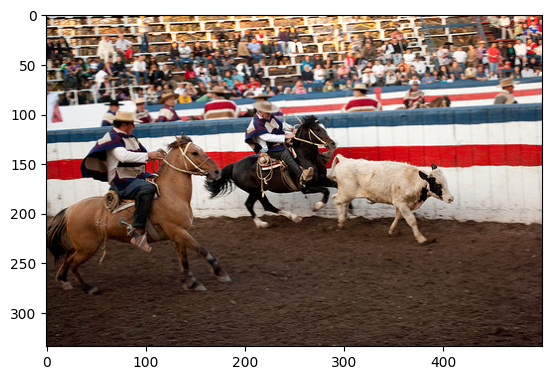

In [50]:
## SAMPLE RUN
index = 100
test_image = ds.image[index]
plt.imshow(test_image.numpy())
print("caption:" , ds.caption_0[index].numpy())

## Process this test_image
processed_test_image = process_image(test_image).unsqueeze(0)
predicted_caption = predict(cnn_feature_extraction, embedder, decoder, post_processor, processed_test_image, device=device)
print("Predicted Caption:", predicted_caption)

# **Testing**

In [51]:
!pip install tqdm
!pip install torch torchvision Pillow numpy tqdm

In [ ]:
import unittest
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import collections

Test Image captioning 

In [53]:
class TestImageCaptioningComponents(unittest.TestCase):
    def setUp(self):
        self.vocab_size = 1000
        self.max_length = 20
        self.embed_dim = 256
        self.num_heads = 1
        self.dropout = 0.1
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        
        # initialize using our classes
        self.embedding = Embedding(self.vocab_size, self.max_length, self.embed_dim).to(self.device)
        self.self_attention = SelfAttention(self.num_heads, self.embed_dim, self.dropout).to(self.device)
        self.cross_attention = CrossAttention(self.embed_dim, self.num_heads, self.dropout).to(self.device)
        self.feed_forward = FeedForward(self.embed_dim, self.dropout).to(self.device)
        
    # test for Embedding()
    def test_embedding_output_dim(self):
        caption = torch.randint(0, self.vocab_size, (1, self.max_length)).to(self.device)
        output = self.embedding(caption)
        self.assertEqual(output.shape, (1, self.max_length, self.embed_dim), "Embedding output dimensions are incorrect")

    # test for SelfAttention()
    def test_selfattention_output_dim(self):
        input_tensor = torch.rand(1, self.max_length, self.embed_dim).to(self.device)
        output = self.self_attention(input_tensor)
        self.assertEqual(output.shape, input_tensor.shape, "Self Attention output dimensions are incorrect")
        
    # test for CrossAttention()
    def test_crossattention_output_dim(self):
        caption_embedding = torch.rand(1, self.max_length, self.embed_dim).to(self.device)
        image_features = torch.rand(1, self.embed_dim).to(self.device)
        output=self.cross_attention(caption_embedding, image_features)
        self.assertEqual(output.shape, caption_embedding.shape, "Cross Attention output dimensions are incorrect")
        
    # test FeedForward()
    def test_feedforward_output_dim(self):
        input_tensor = torch.rand(1, self.max_length, self.embed_dim).to(self.device)
        output = self.feed_forward(input_tensor)
        self.assertEqual(output.shape, input_tensor.shape, "Feed Forward output dimensions are incorrect") 
    
# Running the tests in the notebook
def run_tests():
    test_loader = unittest.TestLoader()
    test_suite = test_loader.loadTestsFromTestCase(TestImageCaptioningComponents)
    test_runner = unittest.TextTestRunner(verbosity=2)
    test_results = test_runner.run(test_suite)
    print(test_results)

In [54]:
run_tests()

test_crossattention_output_dim (__main__.TestImageCaptioningComponents.test_crossattention_output_dim) ... ok
test_embedding_output_dim (__main__.TestImageCaptioningComponents.test_embedding_output_dim) ... ok
test_feedforward_output_dim (__main__.TestImageCaptioningComponents.test_feedforward_output_dim) ... ok
test_selfattention_output_dim (__main__.TestImageCaptioningComponents.test_selfattention_output_dim) ... ok

----------------------------------------------------------------------
Ran 4 tests in 0.053s

OK


embed dim is  256
embed dim is  256
embed dim is  256
embed dim is  256
<unittest.runner.TextTestResult run=4 errors=0 failures=0>


Test PostProcessing

In [55]:
class MockTokenizer:
    def __init__(self, base_vocab_size):
        self.base_vocab_size = base_vocab_size
        self.banned_tokens = ['[UNK]', '[PAD]', '[SEP]', '[CLS]', '[MASK]', 'the', 'a', 'in']
        self.vocab = {str(i): i for i in range(base_vocab_size)}
        self.vocab.update({token: base_vocab_size + i for i, token in enumerate(self.banned_tokens)})
    
    @property
    def vocab_size(self):
        # This should return the total size including the banned tokens
        return self.base_vocab_size + len(self.banned_tokens)

    def banned_tokens_ids(self):
        return [self.vocab[token] for token in self.banned_tokens]

In [56]:
class TestPostProcessing(unittest.TestCase):
    def setUp(self):
        self.embed_dim = 256
        self.base_vocab_size = 1000  # Base vocabulary size excluding banned tokens
        self.tokenizer = MockTokenizer(self.base_vocab_size)
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.banned_tokens = self.tokenizer.banned_tokens
        self.post_processing = PostProcessing(self.embed_dim, self.tokenizer, self.banned_tokens).to(self.device)

    def test_initial_bias(self):
        """Test that initial bias is None."""
        self.assertIsNone(self.post_processing.bias, "Initial bias should be None.")

    def test_adapt_bias_modification(self):
        """ Test the bias computation and adaptation """
        dataset = [torch.tensor([1, 2, 3, 4, 0, 1, 2, 3, 4, 0]) for _ in range(10)]
        self.post_processing.adapt(dataset)
        
        banned_indices = [self.tokenizer.vocab.get(token, -1) for token in self.banned_tokens]
        banned_biases = {token: self.post_processing.bias[idx].item() for token, idx in zip(self.banned_tokens, banned_indices)}
        print("Banned biases:", banned_biases)
        
        self.assertTrue(all(self.post_processing.bias[1:5] < 0), "Regular token biases should be calculated and less negative.")
        
        for idx in banned_indices:
            self.assertTrue(self.post_processing.bias[idx] <= -1e6, f"Bias for banned token should be extremely negative.")
            
    def test_forward_output(self):
        """Test the forward pass output dimensions and values after bias has been set."""
        if self.post_processing.bias is None:
            dataset = [torch.tensor([1, 2, 3, 4, 0, 1, 2, 3, 4, 0]) for _ in range(10)]
            self.post_processing.adapt(dataset) 

        input_tensor = torch.randn(1, 20, self.embed_dim).to(self.device)
        self.post_processing.bias = self.post_processing.bias.to(input_tensor.device)  

        output = self.post_processing(input_tensor)
        self.assertEqual(output.shape, (1, 20, self.base_vocab_size + len(self.banned_tokens)), "Output dimensions should match (batch, sequence length, vocab size).")

In [57]:

def run_tests_postprocessing():
    test_loader = unittest.TestLoader()
    test_suite = test_loader.loadTestsFromTestCase(TestPostProcessing)
    test_runner = unittest.TextTestRunner(verbosity=2)
    test_results = test_runner.run(test_suite)
    print(test_results)
    
run_tests_postprocessing()

test_adapt_bias_modification (__main__.TestPostProcessing.test_adapt_bias_modification)
100%|██████████| 10/10 [00:00<00:00, 67541.13it/s]
ok
test_forward_output (__main__.TestPostProcessing.test_forward_output)
Test the forward pass output dimensions and values after bias has been set. ... 

Banned biases: {'[UNK]': -1000000.0, '[PAD]': -1000000.0, '[SEP]': -1000000.0, '[CLS]': -1000000.0, '[MASK]': -1000000.0, 'the': -1000000.0, 'a': -1000000.0, 'in': -1000000.0}


100%|██████████| 10/10 [00:00<00:00, 116185.71it/s]
ok
test_initial_bias (__main__.TestPostProcessing.test_initial_bias)
Test that initial bias is None. ... ok

----------------------------------------------------------------------
Ran 3 tests in 0.009s

OK


<unittest.runner.TextTestResult run=3 errors=0 failures=0>


In [58]:
class MockTokenizer_cap:
    def __init__(self):
        # Create a vocabulary that the PostProcessing class can use to map names to IDs
        self.vocab = {str(i): i for i in range(100)}  # Example vocabulary with 100 tokens
        self.banned_tokens = ['[UNK]', '[PAD]', '[SEP]', '[CLS]', '[MASK]', 'the', 'a', 'in']
        self.vocab = {**self.vocab, **{token: 100 + i for i, token in enumerate(self.banned_tokens)}}


    def encode(self, text):
        # Simulate encoding text into a sequence of token IDs
        return [self.vocab[str(i)] for i in range(len(text.split()))]

    def decode(self, tokens):
        # Simulate decoding a sequence of token IDs back into text
        return ' '.join(str(token) for token in tokens)

    @property
    def vocab_size(self):
        return len(self.vocab)
    


In [59]:


class TestImageCaption(unittest.TestCase):
    def setUp(self):
        self.tokenizer = MockTokenizer_cap()
        self.model = ImageCaption(
            self.tokenizer, vocab_size=100, num_layers=1, embed_dim=256, max_length=20, num_heads=2, dropout=0.1
        )
        self.model.eval()  
        mock_captions = torch.randint(0, 100, (100, 20))  
        self.model.post_processing_model.adapt(mock_captions)
        

    def test_initialization(self):
        """ Test if the model initializes without errors """
        self.assertIsInstance(self.model, ImageCaption)

    
    
    def test_component_interaction(self):
        """ Test interactions between components within the model """
        dummy_image = torch.rand(1, 3, 224, 224)
        dummy_caption = "another test caption"
        tokens = torch.tensor([self.tokenizer.encode(dummy_caption)])

        # Forward pass
        image_features = self.model.feature_extractor_model(dummy_image)
        token_embeddings = self.model.embedding(tokens)
        decoded_output = self.model.decoder_layer((image_features, token_embeddings))
        final_output = self.model.post_processing_model(decoded_output)

        self.assertTrue(torch.is_tensor(image_features))
        self.assertTrue(torch.is_tensor(token_embeddings))
        self.assertTrue(torch.is_tensor(decoded_output))
        self.assertTrue(torch.is_tensor(final_output))

    def test_error_handling(self):
        """ Test the model's error handling for incorrect inputs """
        with self.assertRaises(Exception):
            self.model((torch.rand(5, 5), "wrong input type for caption"))

In [60]:

def run_tests_caption():
    test_loader = unittest.TestLoader()
    test_suite = test_loader.loadTestsFromTestCase(TestImageCaption)
    test_runner = unittest.TextTestRunner(verbosity=2)
    test_results = test_runner.run(test_suite)
    print(test_results)
    
run_tests_caption()

test_component_interaction (__main__.TestImageCaption.test_component_interaction)
Test interactions between components within the model ... 

embed dim is  256


100%|██████████| 100/100 [00:00<00:00, 124533.97it/s]
ok
test_error_handling (__main__.TestImageCaption.test_error_handling)
Test the model's error handling for incorrect inputs ... 

embed dim is  256


100%|██████████| 100/100 [00:00<00:00, 127408.99it/s]
ok
test_initialization (__main__.TestImageCaption.test_initialization)
Test if the model initializes without errors ... 

embed dim is  256


100%|██████████| 100/100 [00:00<00:00, 124830.48it/s]
ok

----------------------------------------------------------------------
Ran 3 tests in 0.950s

OK


<unittest.runner.TextTestResult run=3 errors=0 failures=0>
